In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
import sys
from scipy import sparse
from pandas.api.types import CategoricalDtype
from datetime import datetime

In [2]:
time_position_changes_df = pd.read_csv("opens_closes_with_time.csv")
time_position_changes_df

,Unnamed: 0,id,trader,amm,margin,position_notional,exchanged_position_size,fee,position_size_after,realized_pnl,...,block_number,timestamp,amm_name,open_close_id,open_id,passed_time_from_last_action,custom_position_capitalization,seconds_passed_from_last_action,passed_time_from_any_last_action,seconds_passed_from_any_last_action
0,0,0x06d54c4ad4bfff493051ef548557f4fa0c76fb2dd678...,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,5.552446e+03,1.665734e+04,8.727098e-01,16.657338,8.727098e-01,0.000000e+00,...,13508290,2020-12-14 03:16:05,BTC/USDC,0.0,1.0,NaN,1.668646e+04,NaN,NaN,NaN
1,1,0xe9d804889de5a27a356777a588d6c018e55fa1cae61c...,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.111460e+04,1.668646e+04,8.711866e-01,16.686462,1.743896e+00,0.000000e+00,...,13508954,2020-12-14 04:11:45,BTC/USDC,0.0,1.0,0 days 00:55:40,3.346050e+04,3340.0,0 days 00:55:40,3340.0
2,2,0xea81e16520eae51395b4627365487daa2013df876ef3...,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,0.000000e+00,3.334380e+04,-1.743896e+00,33.343800,0.000000e+00,-1.782200e-14,...,13509011,2020-12-14 04:16:30,BTC/USDC,0.0,1.0,0 days 00:04:45,0.000000e+00,285.0,0 days 00:04:45,285.0
3,3,0xcbc30cda2cff5814702d67c67530f6598a670ad990f3...,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,5.555467e+03,1.666640e+04,8.722351e-01,16.666402,8.722351e-01,0.000000e+00,...,13511238,2020-12-14 07:23:25,BTC/USDC,16.0,2.0,0 days 03:06:55,1.669554e+04,11215.0,0 days 03:06:55,11215.0
4,4,0xb7f635c0407feb60d7386e18b0d102503e5c9f034be9...,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,0x0f346e19f01471c02485df1758cfd3d624e399b4,1.112383e+04,1.670391e+04,8.702764e-01,16.703914,1.742512e+00,0.000000e+00,...,13512310,2020-12-14 08:53:25,BTC/USDC,0.0,2.0,0 days 01:30:00,3.350390e+04,5400.0,0 days 01:30:00,5400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9341945,9341945,0x46558498bb5962a524f0b63d724d92777bb17b504e44...,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,3.690119e+03,2.154072e+03,5.000000e+01,2.154072,3.000000e+02,0.000000e+00,...,21019327,2022-03-09 11:41:00,FTT/USDC,0.0,1.0,0 days 00:01:50,1.292737e+04,110.0,0 days 00:01:50,110.0
9341946,9341946,0x3ddf503cacc2125a68cc17a9b84e2971d6242423eea0...,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,1.100000e-17,1.286891e+04,-3.000000e+02,12.868911,-1.000000e-18,-4.650566e+01,...,21021513,2022-03-09 14:54:15,FTT/USDC,0.0,1.0,0 days 03:13:15,-4.283794e-17,11595.0,0 days 03:13:15,11595.0
9341947,9341947,0x4215d5f56936f1604171ada50922c0e5af609369ea10...,0xb39885f302643a5f96f743c3621d628dc3f72ce6,0x838b322610bd99a449091d3bf3fba60d794909a9,0.000000e+00,4.300000e-17,1.000000e-18,0.000000,0.000000e+00,-2.000000e-18,...,21021523,2022-03-09 14:55:10,FTT/USDC,0.0,1.0,0 days 00:00:55,0.000000e+00,55.0,0 days 00:00:55,55.0
9341948,9341948,0x507dae82675d33cc29766b5792ef6c527149ac4ddae4...,0xa84daa76815f6d2cf99e406bd693e8588bc36dbe,0x838b322610bd99a449091d3bf3fba60d794909a9,1.000000e+00,1.500000e+00,3.664475e-02,0.001500,3.664475e-02,0.000000e+00,...,21061399,2022-03-12 00:22:55,FTT/USDC,1231736.0,1.0,NaN,1.500000e+00,NaN,-1 days +23:59:35,86375.0


# Counting pools where traders were active

In [4]:
amm_trader_list = []

for amm in time_position_changes_df['amm_name'].unique():
    amm_story = time_position_changes_df[time_position_changes_df['amm_name'] == amm]
    amm_trader_df = pd.DataFrame(columns=['amm', 'trader'])
    amm_trader_df['trader'] = amm_story['trader'].unique()
    amm_trader_df['amm'] = [amm] * len(amm_story['trader'].unique())
    amm_trader_list.append(amm_trader_df)
    
traders_amm_df = pd.concat(amm_trader_list)
traders_amm_df["count"] = [1] * len(traders_amm_df)
traders_amm_df

,amm,trader,count
0,BTC/USDC,0x1a48776f436bcdaa16845a378666cf4ba131eb0f,1
1,BTC/USDC,0x9602686bf53a17baed60c48ba34ed4219a532381,1
2,BTC/USDC,0x43bd90e4cc93d6e40580507102cc7b1bc8a25284,1
3,BTC/USDC,0x5bea7caa02142ba59885466757e1112819731f09,1
4,BTC/USDC,0x069a67b8f965d02d095be12ae55e31e769692df4,1
...,...,...,...
561,FTT/USDC,0xc0f872a7127bdc6d98af04899d1a1d22376c7b6b,1
562,FTT/USDC,0x419df1d41f84de3d3854a4e6d0b4d772ebd1b13b,1
563,FTT/USDC,0xb39885f302643a5f96f743c3621d628dc3f72ce6,1
564,FTT/USDC,0xa84daa76815f6d2cf99e406bd693e8588bc36dbe,1


In [5]:
users = traders_amm_df["trader"].unique()
amms = traders_amm_df["amm"].unique()
shape = (len(users), len(amms))

user_cat = CategoricalDtype(categories=sorted(users), ordered=True)
amms_cat = CategoricalDtype(categories=sorted(amms), ordered=True)

user_index = traders_amm_df["trader"].astype(user_cat).cat.codes
amm_index = traders_amm_df["amm"].astype(amms_cat).cat.codes

# Conversion via COO matrix
coo = sparse.coo_matrix((traders_amm_df["count"], (user_index, amm_index)), shape=shape)
csr = coo.tocsr()

In [6]:
stats_df = pd.DataFrame.sparse.from_spmatrix(csr, columns=amms_cat.categories)
stats_df.index = user_cat.categories
stats_df['occurencies_sum'] = stats_df.sum(axis=1)
stats_df

,AAVE/USDC,ALPHA/USDC,BTC/USDC,COMP/USDC,CREAM/USDC,CRV/USDC,DOT/USDC,ETH/USDC,FTT/USDC,GRT/USDC,LINK/USDC,MKR/USDC,PERP/USDC,REN/USDC,SNX/USDC,SUSHI/USDC,UNI/USDC,YFI/USDC,occurencies_sum
0x000000003b0371b33aba8b6b58154a98d54695ad,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
0x000000064730640b7d670408d74280924883064f,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
0x0000000813b34008a225de08a6a61835508c71f9,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
0x000000ea89990a17ec07a35ac2bbb02214c50152,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,17
0x0000ce08fa224696a819877070bf378e8b131acf,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0xffe694afb3b54ee0add6ded4cc0f9917777f13da,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
0xfffb40347816873ca038756cc87bc610144166b2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
0xfffdd2572f57b6457c8c4b0320e8f1f1ec4812bd,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
0xfffe45d946f1f715dc0252df3db22a9edfaf5738,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1


In [7]:
entire_perpetual_traders_df = stats_df[stats_df['occurencies_sum'] == 18]
bots_positions_df = time_position_changes_df[time_position_changes_df['trader'].isin(entire_perpetual_traders_df.index)]

# Analysis of the bots data

In [8]:
time_position_changes_df["timestamp"] = pd.to_datetime(time_position_changes_df['timestamp'])

In [10]:
time_position_changes_2021_df = time_position_changes_df[(time_position_changes_df["timestamp"] >= datetime(2021, 1, 1)) &
                                                         (time_position_changes_df['timestamp'] <= datetime(2021, 12, 31))]

In [13]:
time_position_changes_2021_df['day_of_year'] = time_position_changes_2021_df["timestamp"].dt.day_of_year

<ipython-input-13-f4c43fef0cc9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time_position_changes_2021_df['day_of_year'] = time_position_changes_2021_df["timestamp"].dt.day_of_year


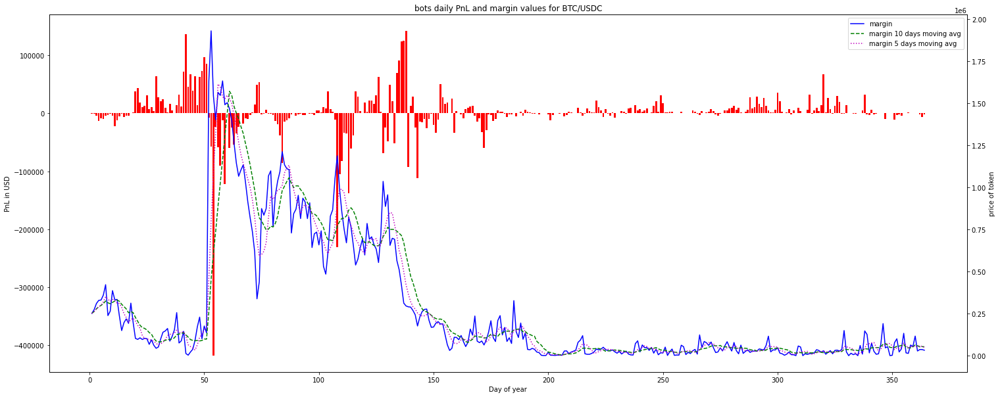

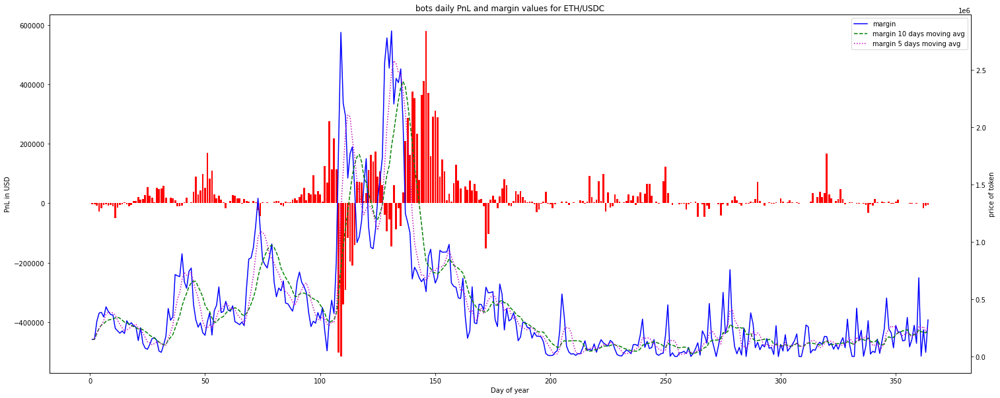

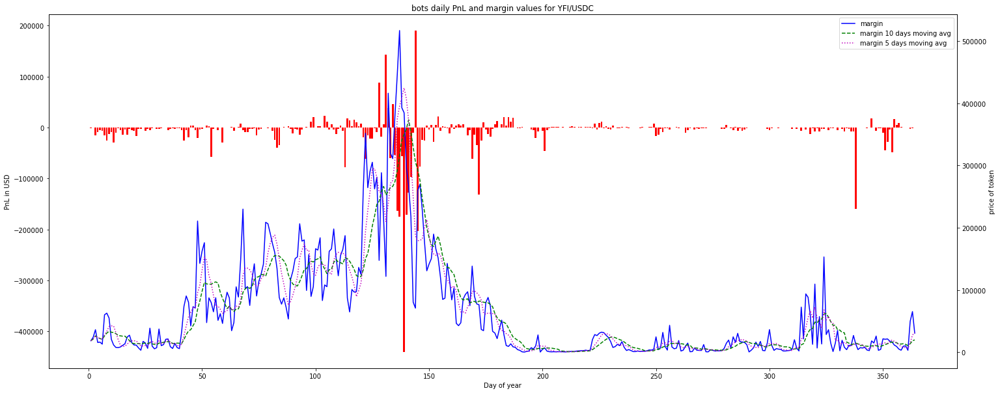

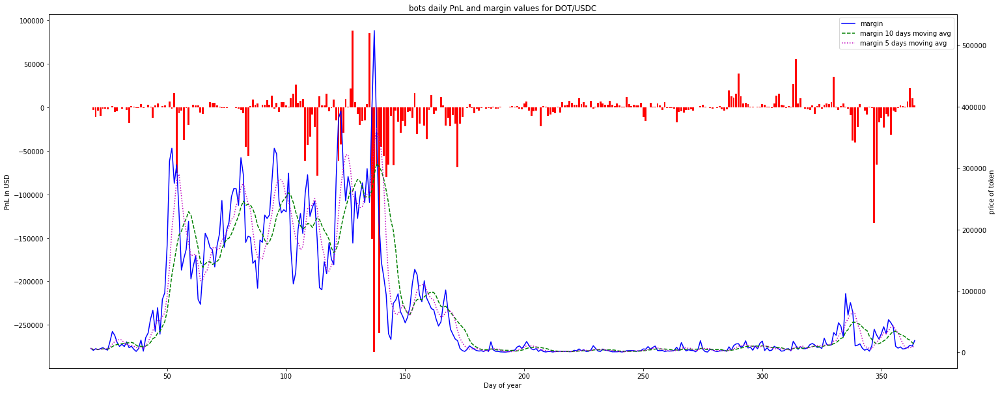

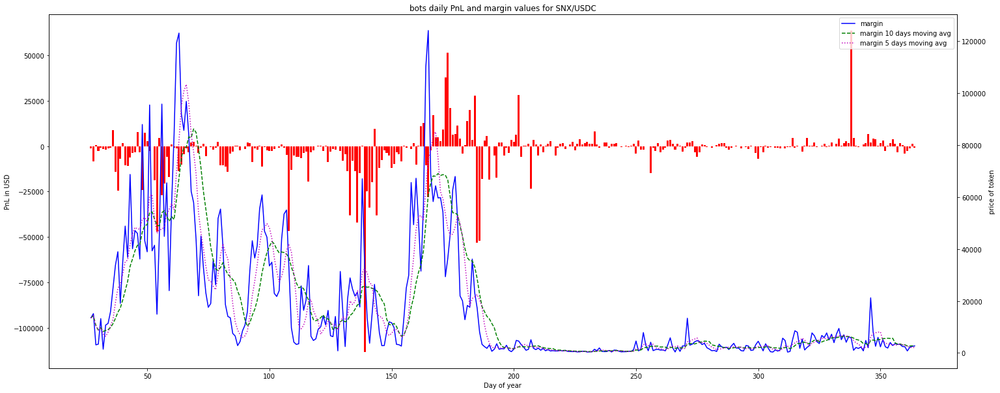

...

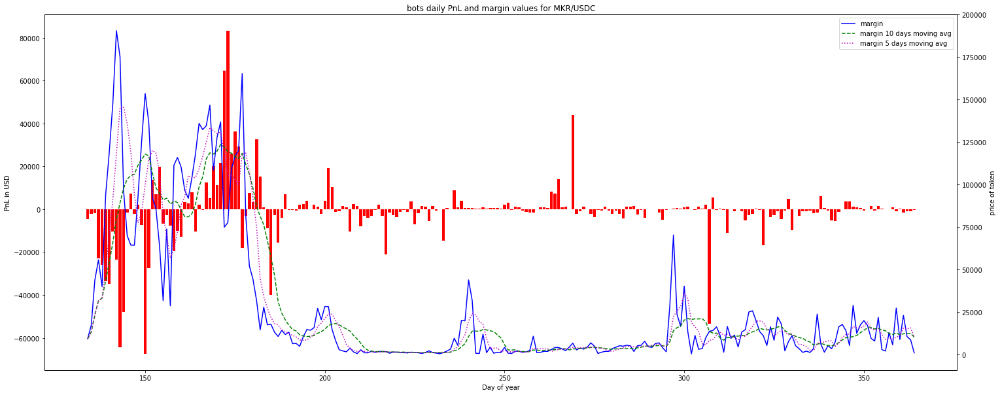

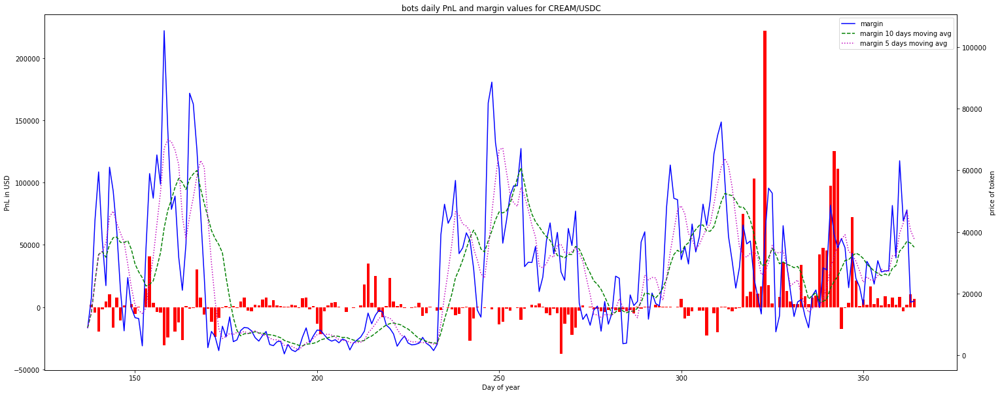

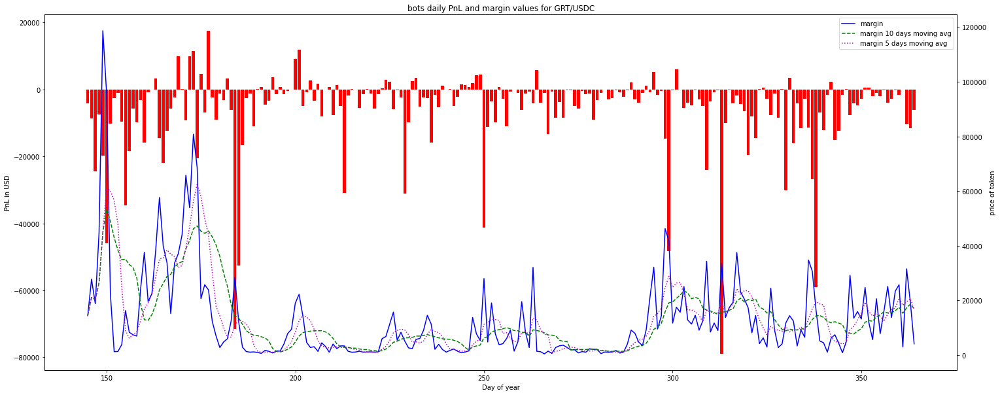

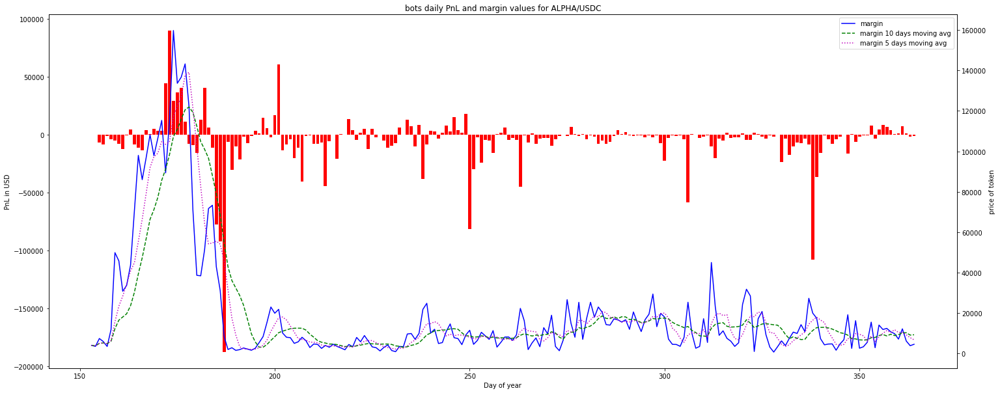

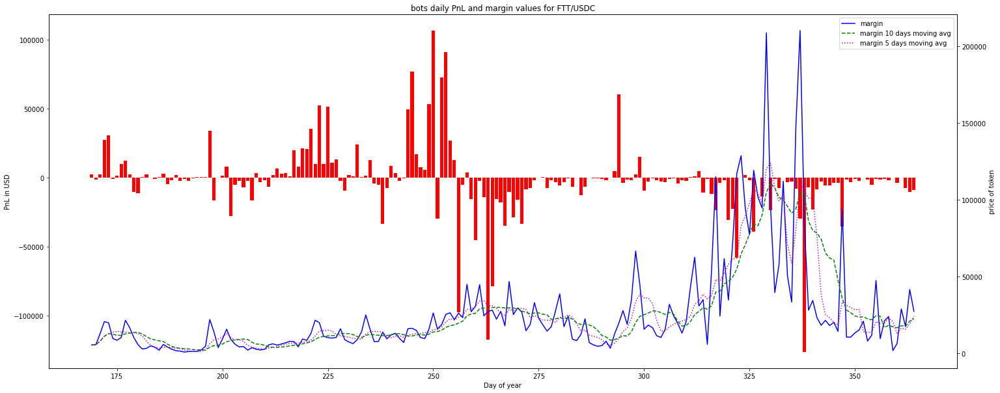

In [14]:
for amm in time_position_changes_2021_df["amm_name"].unique():
    changes_2021_for_amm_df = time_position_changes_2021_df[(time_position_changes_2021_df["amm_name"] == amm) &
                                                            (time_position_changes_2021_df["trader"].isin(bots_positions_df['trader']))]
    changes_sum_2021_for_amm_df = changes_2021_for_amm_df.groupby(["day_of_year"]).sum()
    fig, ax = plt.subplots(figsize=(25, 10))
    ax2 = ax.twinx()
    ax.bar(changes_sum_2021_for_amm_df.index, changes_sum_2021_for_amm_df['realized_pnl'], color='r')
    ax2.plot(changes_2021_for_amm_df.groupby(["day_of_year"]).mean()["margin"], color='b', label='margin')
    ax2.plot(changes_2021_for_amm_df.groupby(['day_of_year']).mean()['margin'].transform(lambda x: x.rolling(10, 1).mean()), color='g', 
             label='margin 10 days moving avg', linestyle='--')
    ax2.plot(changes_2021_for_amm_df.groupby(['day_of_year']).mean()['margin'].transform(lambda x: x.rolling(5, 1).mean()), color='m', 
             label='margin 5 days moving avg', linestyle=':')
    ax.set_xlabel("Day of year")
    ax.set_ylabel("PnL in USD")
    ax2.set_ylabel("price of token")
    ax.set_title("bots daily PnL and margin values for " + amm)
    ax2.legend()
    plt.xticks(rotation=45)
    plt.show()

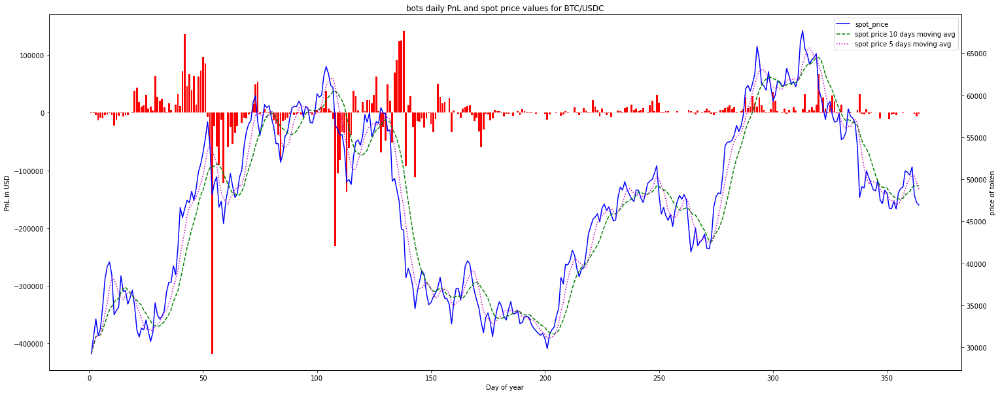

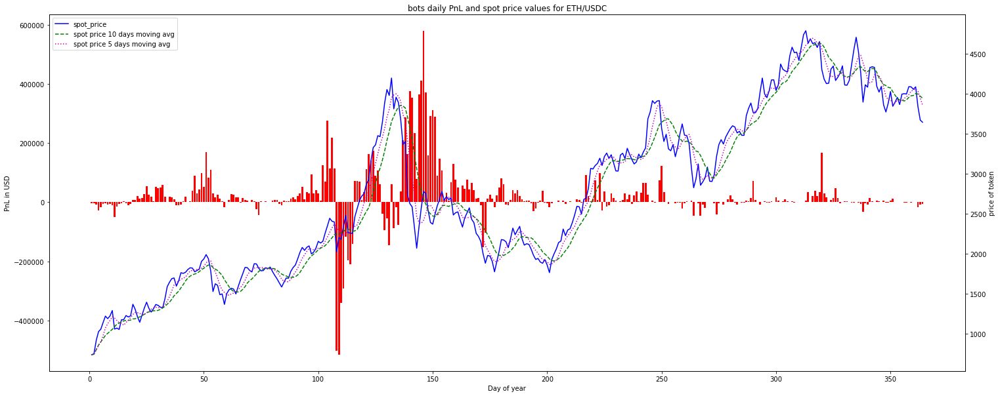

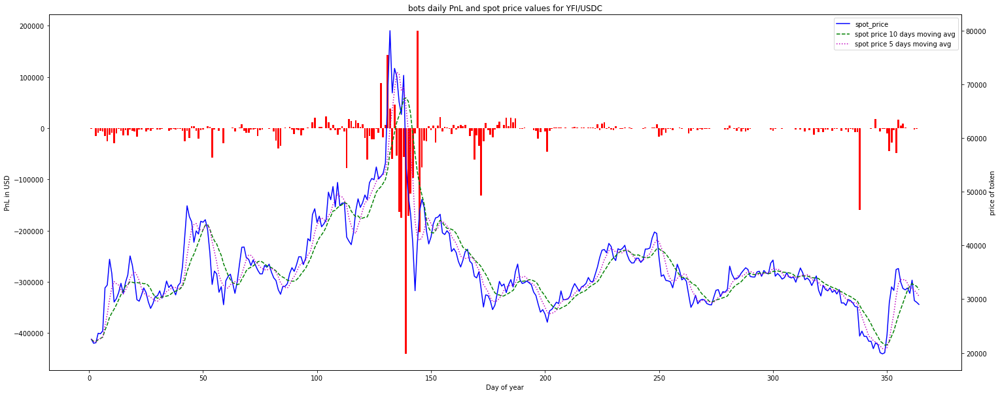

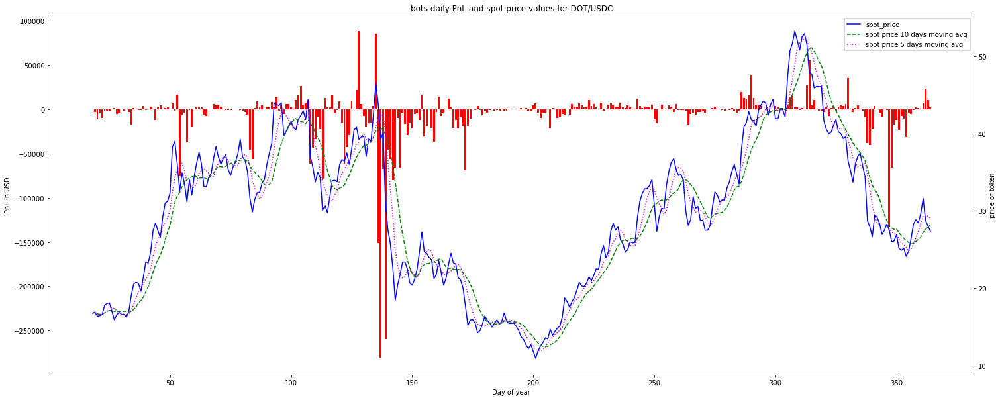

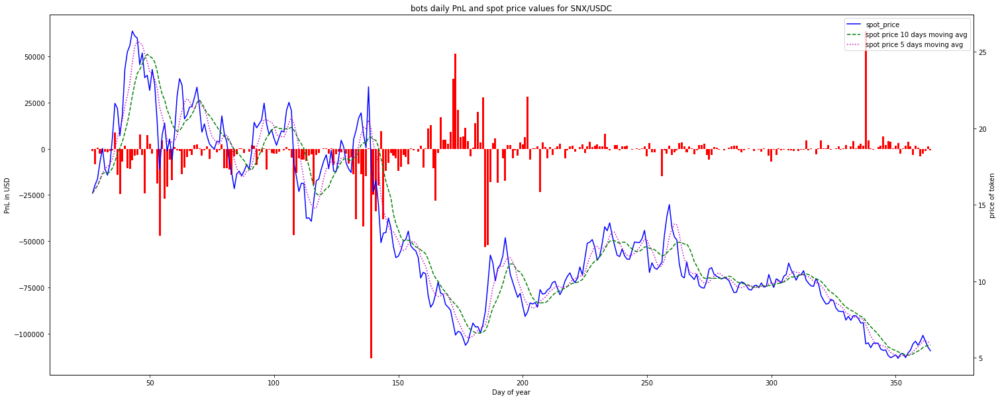

...

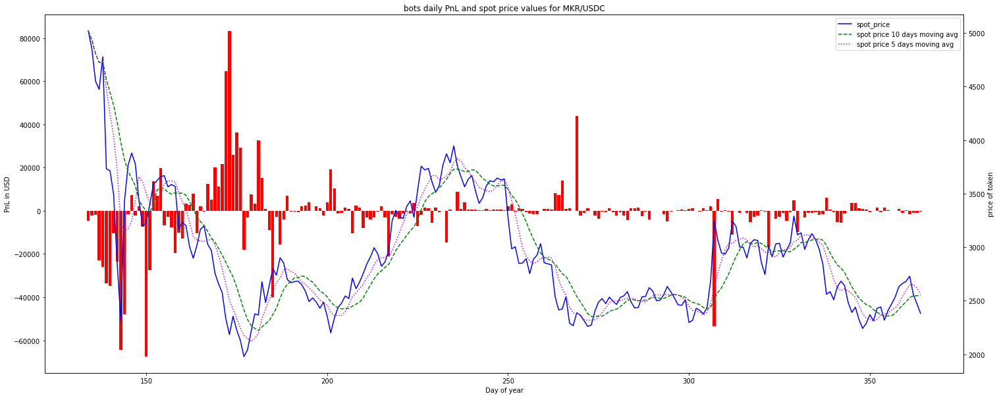

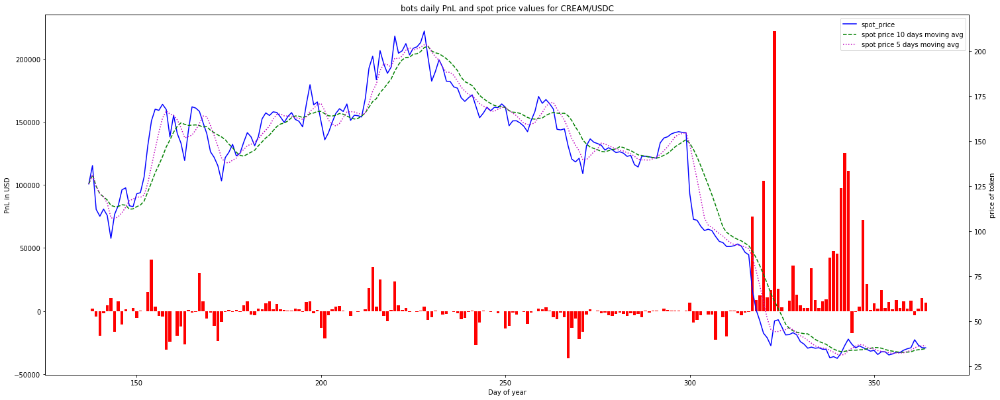

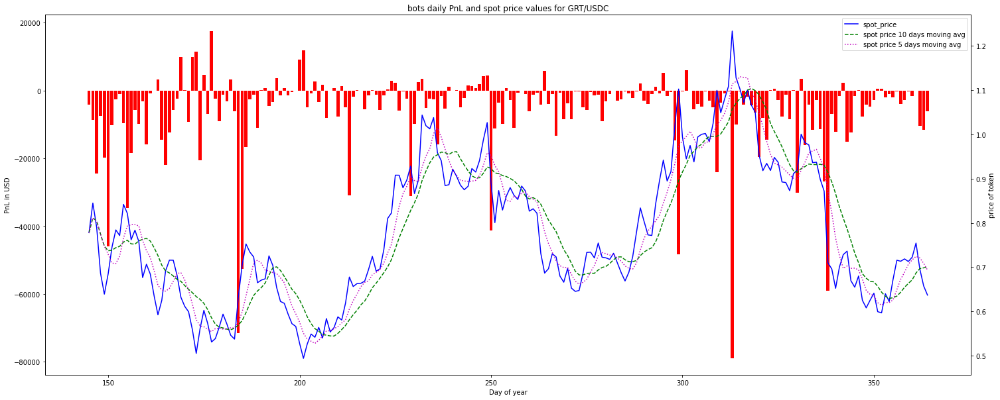

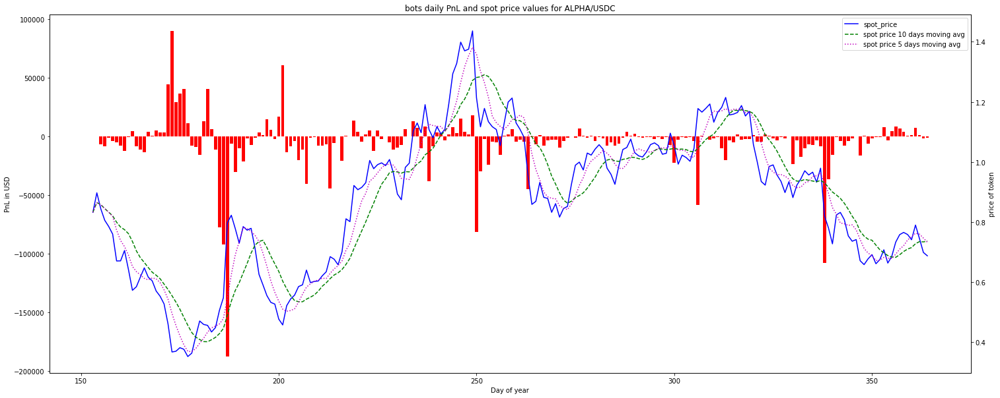

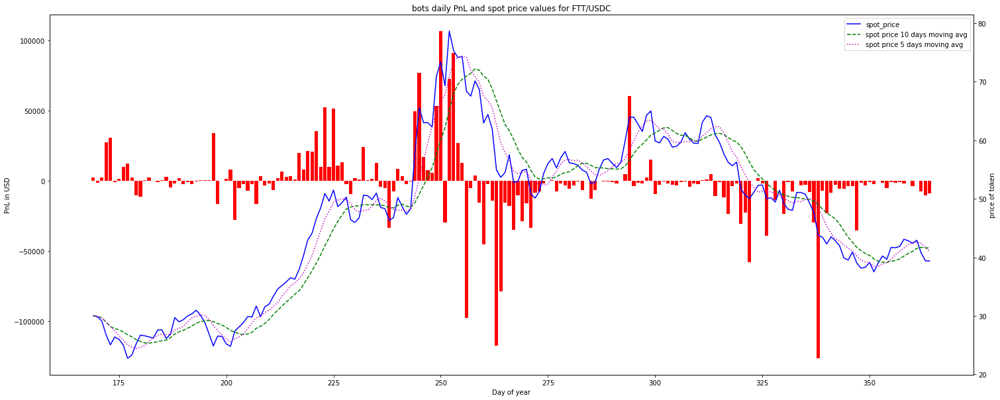

In [15]:
for amm in time_position_changes_2021_df["amm_name"].unique():
    changes_2021_for_amm_df = time_position_changes_2021_df[(time_position_changes_2021_df["amm_name"] == amm) &
                                                            (time_position_changes_2021_df["trader"].isin(bots_positions_df['trader']))]
    changes_sum_2021_for_amm_df = changes_2021_for_amm_df.groupby(["day_of_year"]).sum()
    fig, ax = plt.subplots(figsize=(25, 10))
    ax2 = ax.twinx()
    ax.bar(changes_sum_2021_for_amm_df.index, changes_sum_2021_for_amm_df['realized_pnl'], color='r')
    ax2.plot(changes_2021_for_amm_df.groupby(["day_of_year"]).mean()["spot_price"], color='b', label='spot_price')
    ax2.plot(changes_2021_for_amm_df.groupby(['day_of_year']).mean()['spot_price'].transform(lambda x: x.rolling(10, 1).mean()), color='g', 
             label='spot price 10 days moving avg', linestyle='--')
    ax2.plot(changes_2021_for_amm_df.groupby(['day_of_year']).mean()['spot_price'].transform(lambda x: x.rolling(5, 1).mean()), color='m', 
             label='spot price 5 days moving avg', linestyle=':')
    ax.set_xlabel("Day of year")
    ax.set_ylabel("PnL in USD")
    ax2.set_ylabel("price of token")
    ax.set_title("bots daily PnL and spot price values for " + amm)
    ax2.legend()
    plt.xticks(rotation=45)
    plt.show()

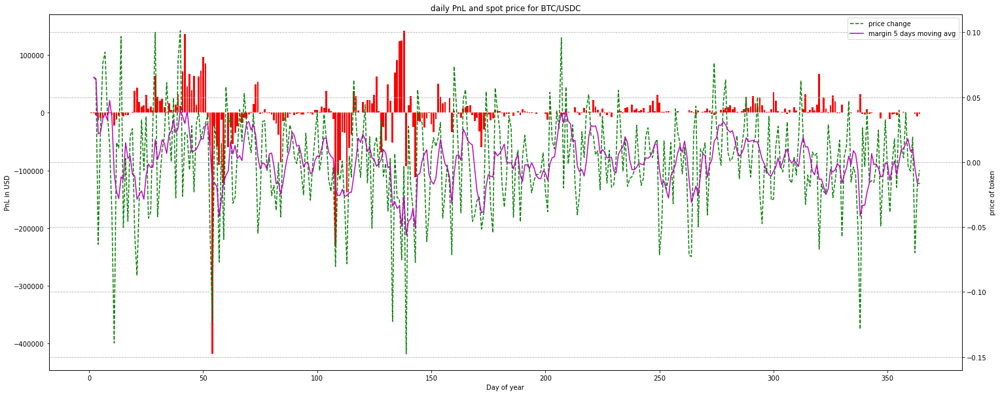

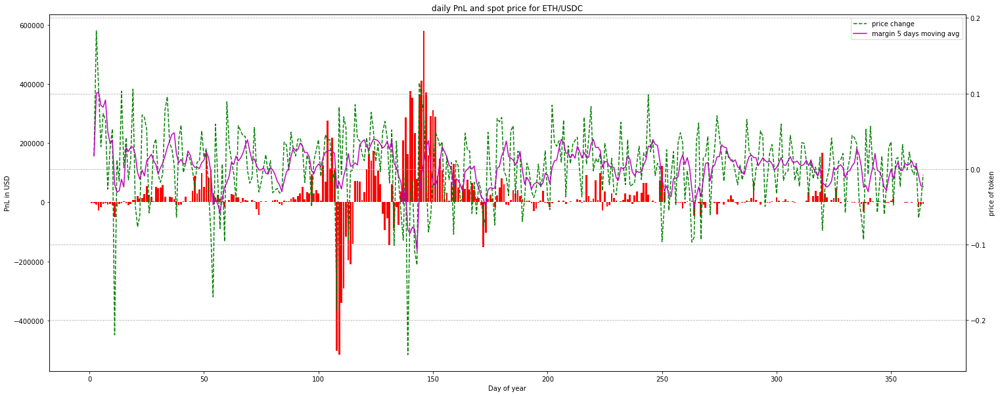

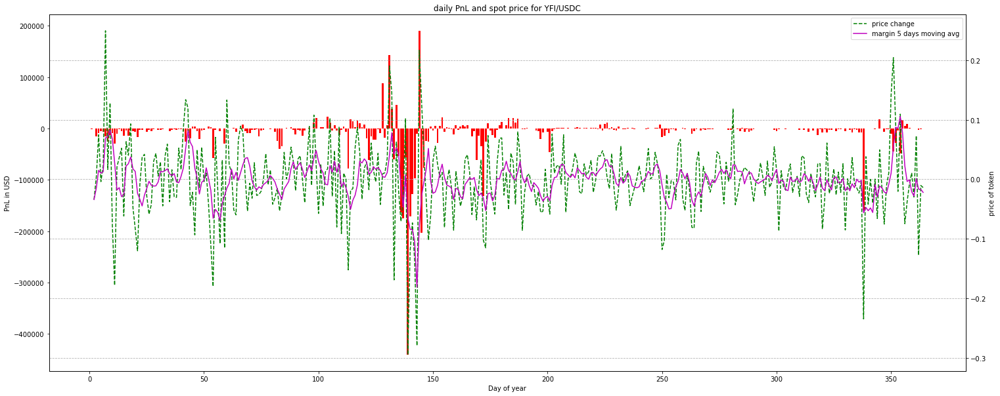

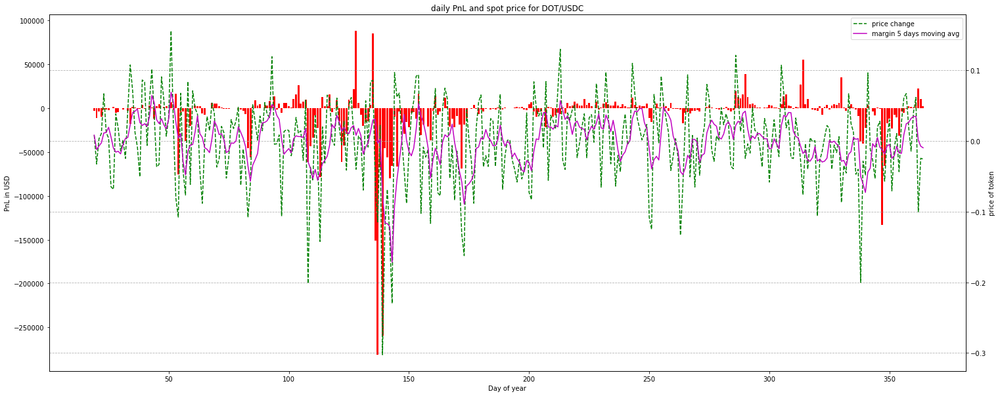

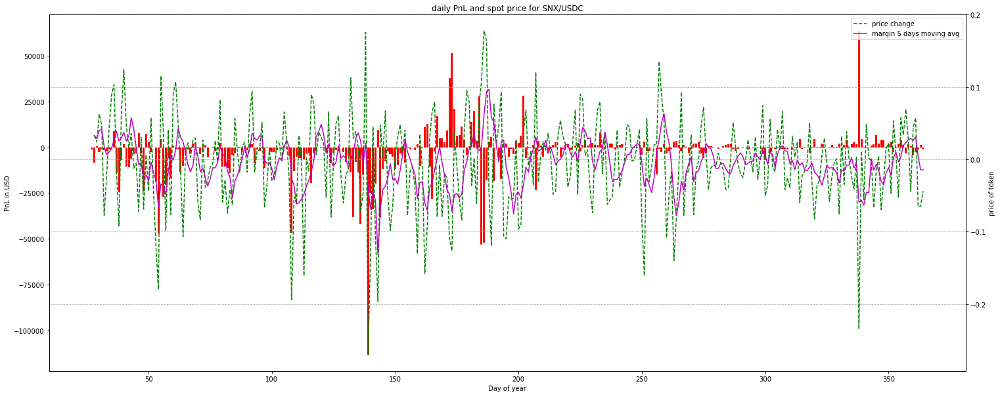

...

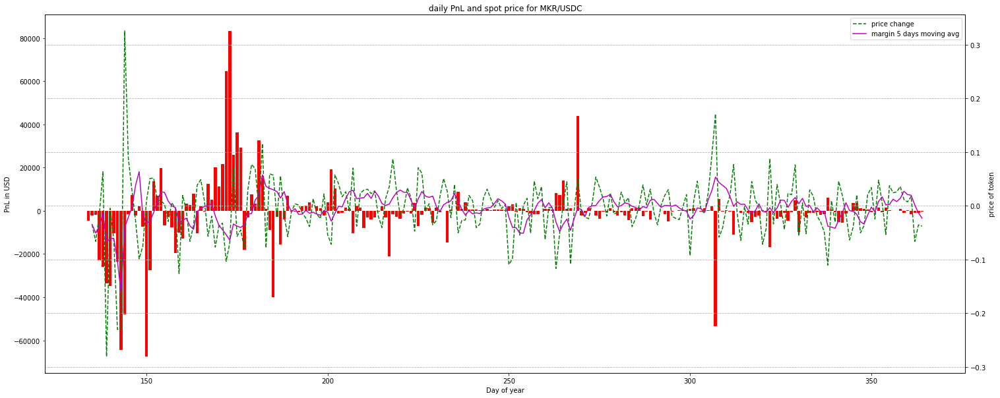

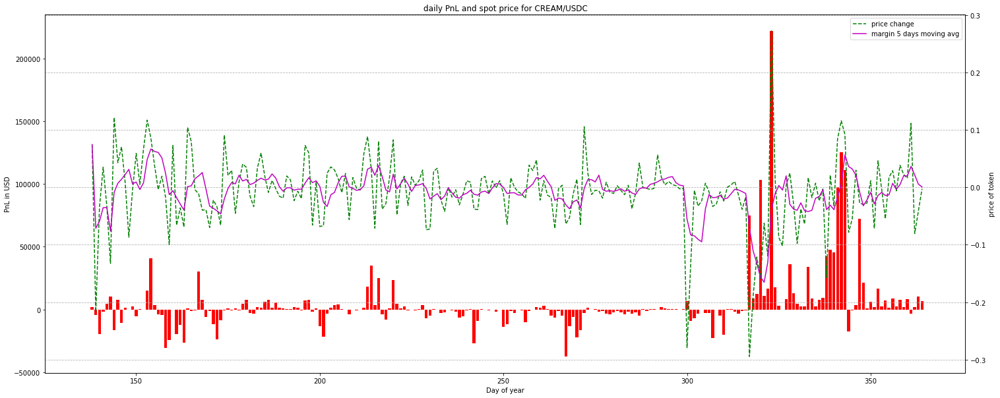

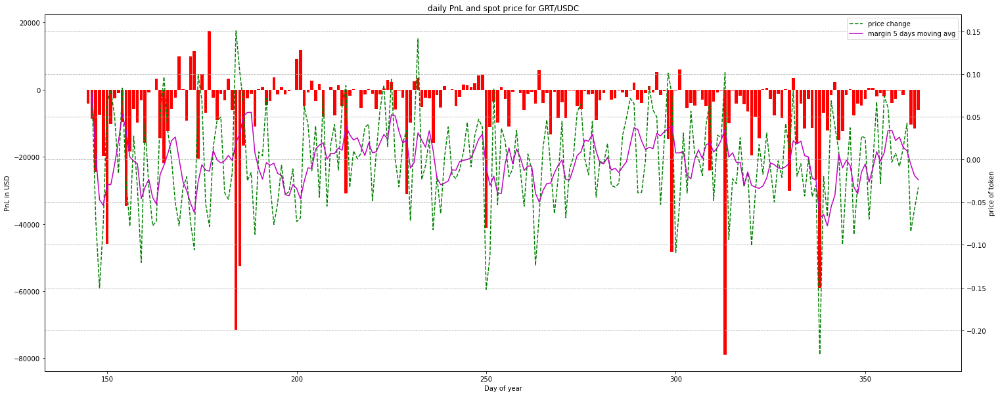

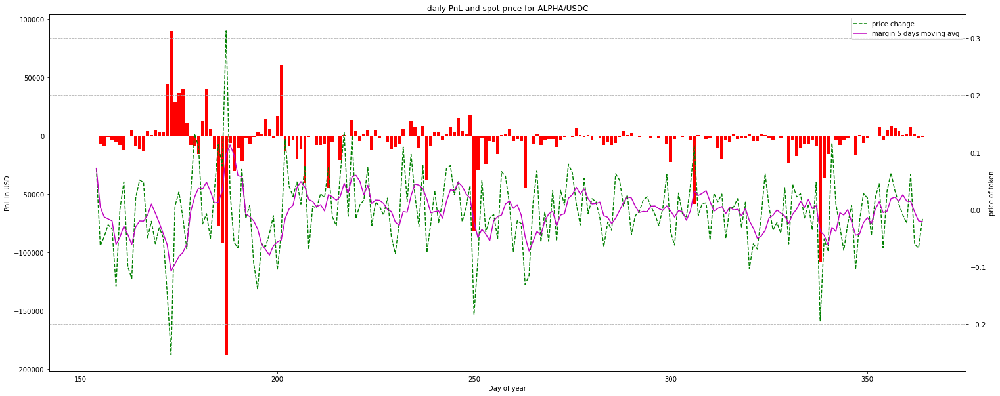

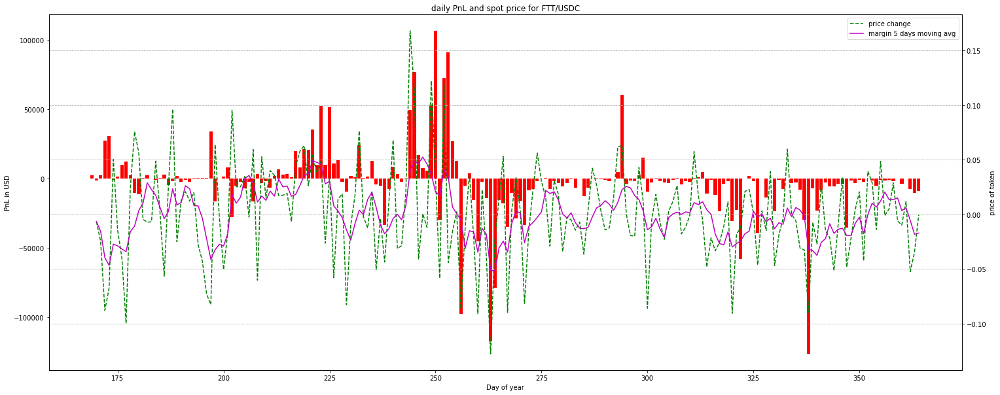

In [21]:
for amm in time_position_changes_2021_df["amm_name"].unique():
    changes_2021_for_amm_df = time_position_changes_2021_df[(time_position_changes_2021_df["amm_name"] == amm) &
                                                            (time_position_changes_2021_df["trader"].isin(bots_positions_df['trader']))]
    changes_sum_2021_for_amm_df = changes_2021_for_amm_df.groupby(["day_of_year"]).sum()
    changes_mean_2021_for_amm_df = changes_2021_for_amm_df.groupby(['day_of_year']).mean()
    fig, ax = plt.subplots(figsize=(25, 10))
    ax2 = ax.twinx()
    ax.bar(changes_sum_2021_for_amm_df.index, changes_sum_2021_for_amm_df['realized_pnl'], color='r')
    ax2.plot((changes_mean_2021_for_amm_df["spot_price"] - changes_mean_2021_for_amm_df["spot_price"].shift(1)) / changes_mean_2021_for_amm_df["spot_price"], 
             color='g', linestyle='--', label='price change')
    ax2.plot(((changes_mean_2021_for_amm_df["spot_price"] - changes_mean_2021_for_amm_df["spot_price"].shift(1)) / changes_mean_2021_for_amm_df["spot_price"]).transform(lambda x: x.rolling(5, 1).mean()), color='m', 
             label='margin 5 days moving avg')
    ax.set_xlabel("Day of year")
    ax.set_ylabel("PnL in USD")
    ax2.set_ylabel("price of token")
    ax.set_title("daily PnL and spot price for " + amm)
    ax2.legend()
    ax2.grid(True, linestyle='--')
    plt.xticks(rotation=45)
    plt.show()